In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import netCDF4
import datetime
import pandas as pd 
import os
import contextily as cx
import pyproj
import geopandas as gpd
from pyproj import Transformer
from shapely.geometry import Point
from tqdm import tqdm
import requests
import hydroTwin
from scipy.interpolate import interp1d
import importlib

In [17]:
listFile = ["EFAS_historical_2017", "EFAS_historical_2018", "EFAS_historical_2019", "EFAS_historical_2020",
            "EFAS_historical_2021", "EFAS_historical_2022", "EFAS_historical_2023", "EFAS_historical_2024",
            "EFAS_historical_2025"]

In [18]:
efasDict = {}

for f in listFile : 
    ds = xr.open_dataset("c:/Users/paoliniart/Documents/" + f + ".nc")
    dsReduced = ds.sel(latitude=slice(52, 42), longitude=slice(-5, 12))
    efasDict[f] = dsReduced.copy()

In [19]:
listCentrales = os.listdir("./debits/comparaison efas")

In [20]:
mesuresDict = {}

for f in listCentrales : 
    df = pd.read_csv("./debits/comparaison efas/" + f)
    df['Date (TU)'] = pd.to_datetime(df['Date (TU)'])
    mesuresDict[f[:-4]] = df


In [21]:
coordonnesLacs = [(6.1829659, 45.0386083), (5.9093175, 44.8175478), (6.2727640, 44.4709131), (6.9872100, 45.4474425), (5.9277169, 43.7502443)]

In [2]:
prodCentrales = pd.read_parquet("1990-01-01_2100-01-01_hydro_H.parquet")

In [23]:
listProd = ["SAUTEH", "SSGUIH", "S.PONH", "V.ISH", "VINONH"]

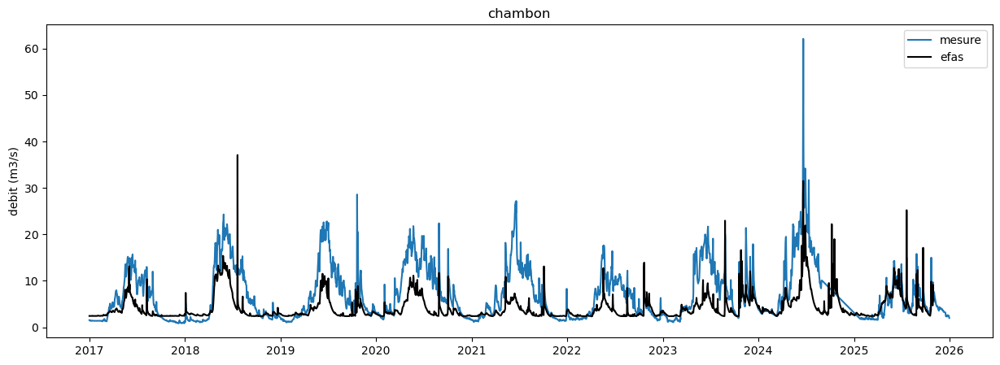

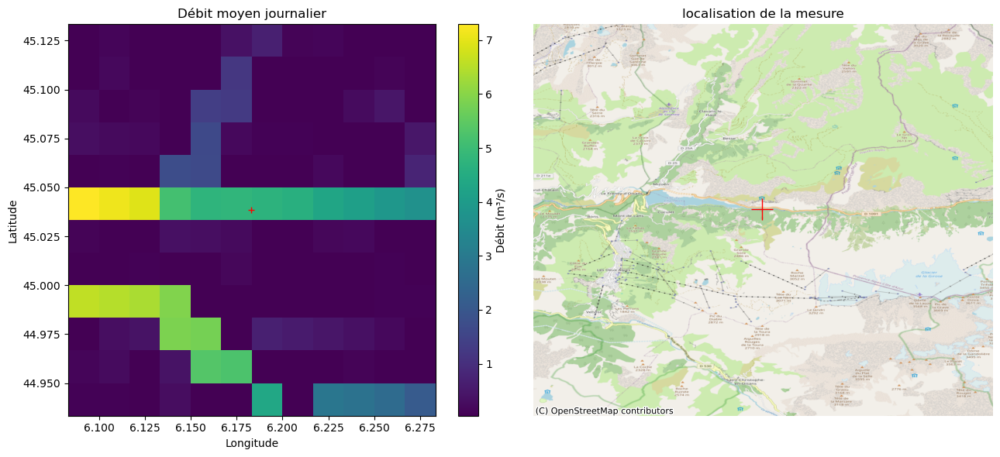

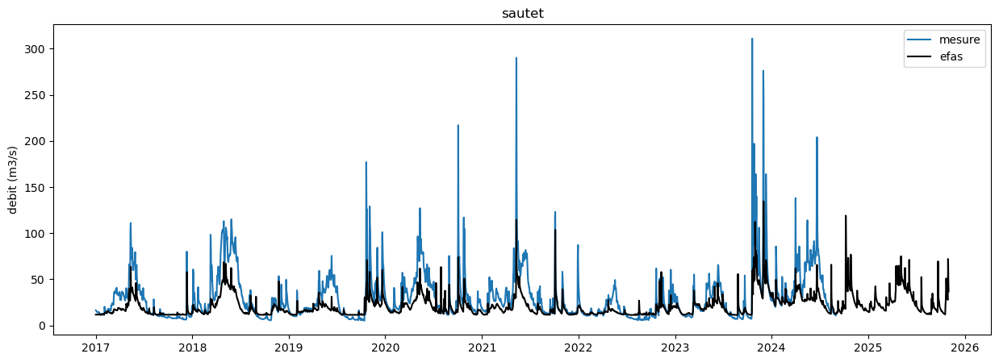

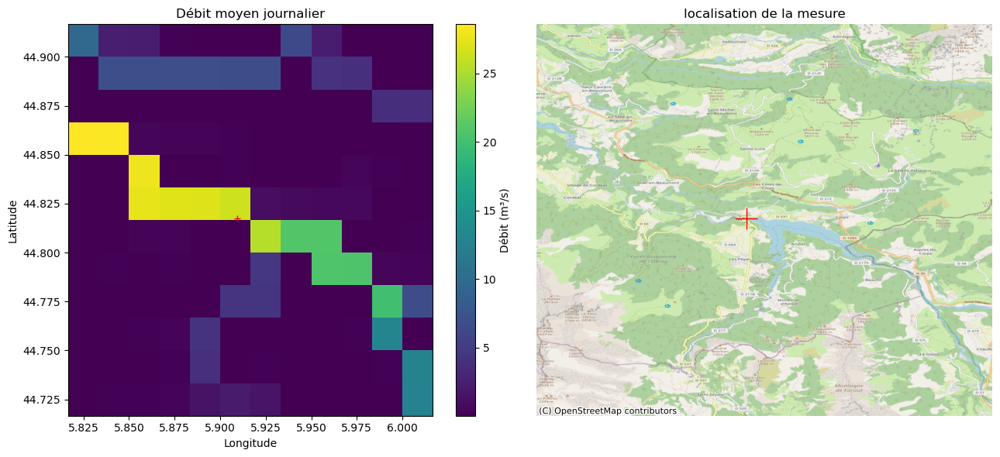

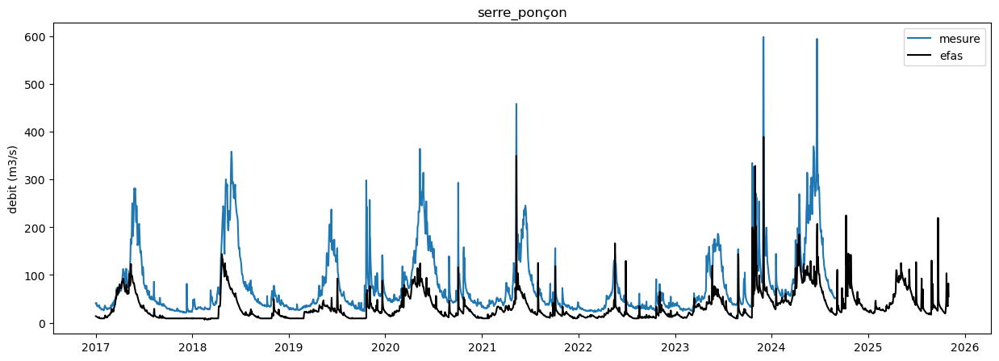

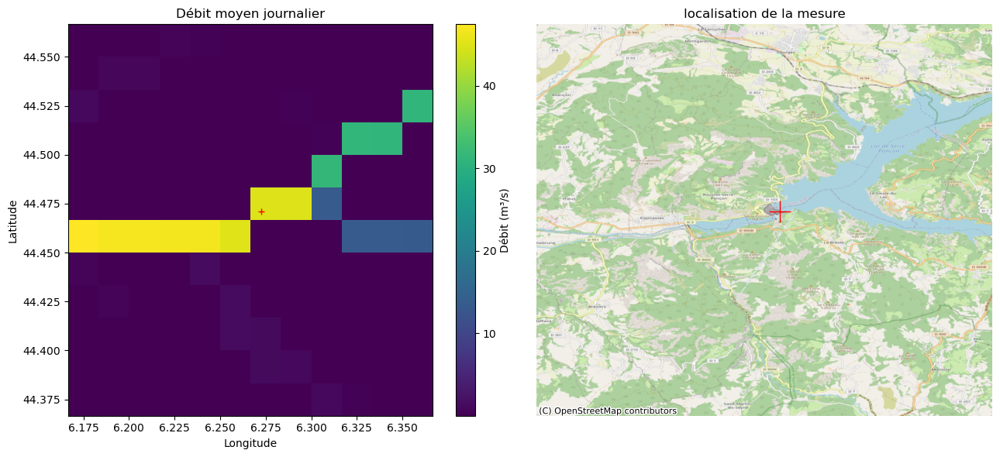

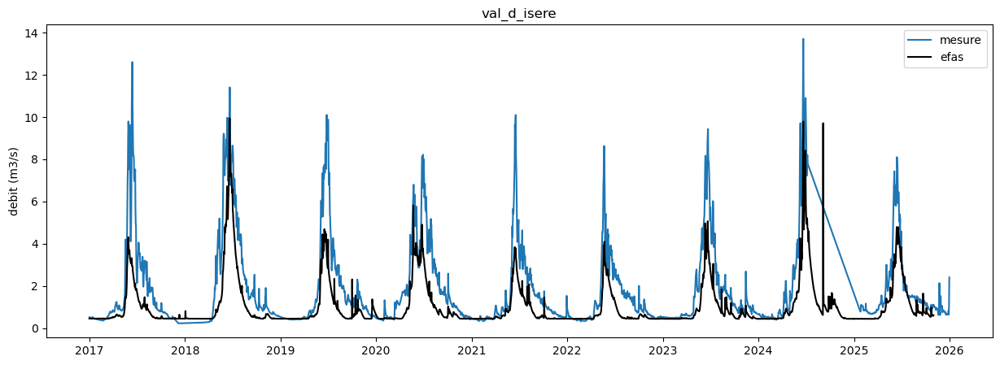

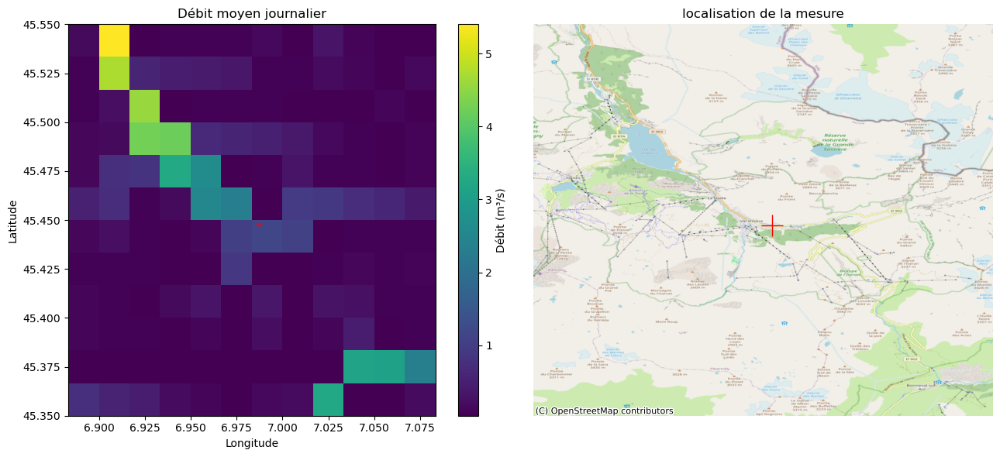

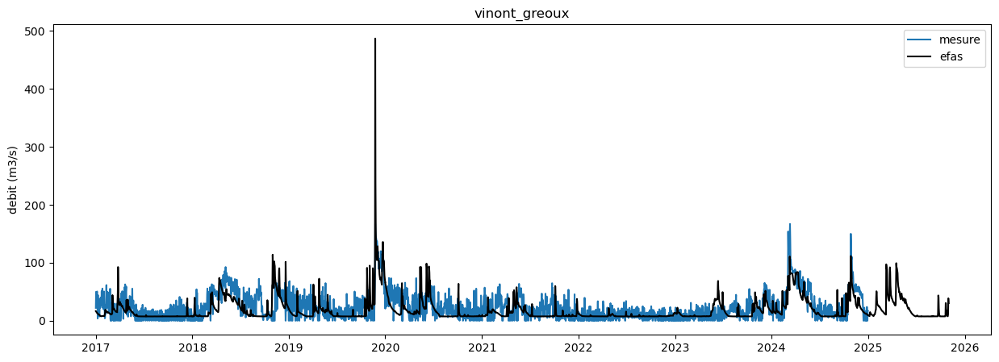

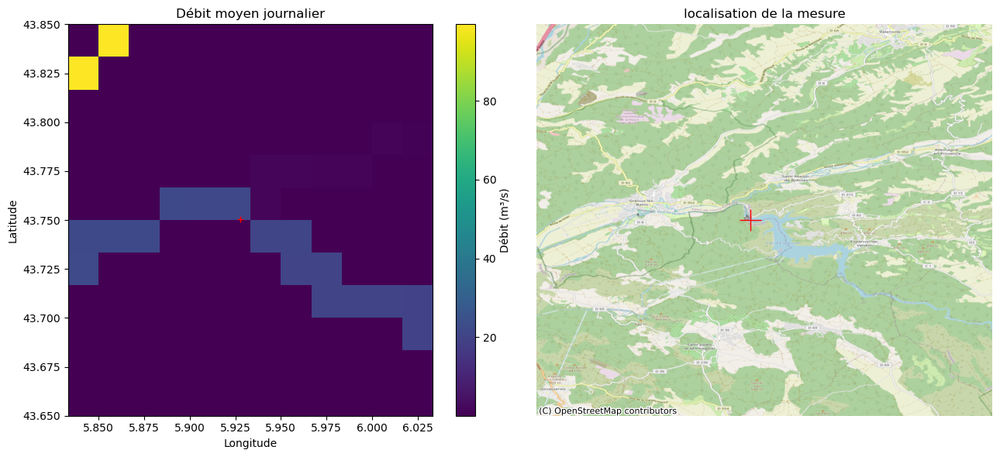

In [24]:
for coords, c in zip(coordonnesLacs, listCentrales) :
    plt.figure(figsize = (15, 5))
    plt.plot(mesuresDict[c[:-4]]['Date (TU)'], mesuresDict[c[:-4]]['Valeur (en m³/s)'])
    for f in listFile :
        flow = efasDict[f].sel(latitude = coords[1], longitude = coords[0], method = "nearest").resample(valid_time = '1D').mean()
        plt.plot(flow.valid_time, flow.dis06, color = "black")
    plt.title(c[:-4])
    plt.ylabel("debit (m3/s)")
    plt.legend(['mesure', 'efas'])
    # Extraction de la zone
    carte = efasDict[f].sel(
        latitude=slice(coords[1] + 0.1, coords[1] - 0.1),
        longitude=slice(coords[0] - 0.1, coords[0] + 0.1)
    ).dis06.mean(dim='valid_time')

    # Préparation données raster pour la carte (grilles projetées)
    lon2d, lat2d = np.meshgrid(carte.longitude, carte.latitude)
    proj = pyproj.Transformer.from_crs(4326, 3857, always_xy=True)
    x, y = proj.transform(lon2d, lat2d)
    x_point, y_point = proj.transform(coords[0], coords[1])

    fig, axs = plt.subplots(1, 2, figsize=(13, 6))

    # 1) Carte de valeurs
    pc = axs[0].pcolormesh(lon2d, lat2d, carte.values, shading="auto")
    axs[0].plot(coords[0], coords[1], '+r')
    axs[0].set_title("Débit moyen journalier")
    axs[0].set_xlabel("Longitude")
    axs[0].set_ylabel("Latitude")
    plt.colorbar(pc, ax=axs[0], label='Débit (m³/s)')

    # 2) Carte OpenStreetMap avec le point
    # On utilise la projection WebMercator (EPSG:3857)
    axs[1].set_title('localisation de la mesure')
    axs[1].set_axis_off()

    # Limites de la carte pour tuile OSM (avant le fond)
    axs[1].set_xlim(x.min(), x.max())
    axs[1].set_ylim(y.min(), y.max())

    cx.add_basemap(axs[1], crs='EPSG:3857', source=cx.providers.OpenStreetMap.Mapnik, zoom=13)
    axs[1].plot(x_point, y_point, '+r', markersize=20)

    plt.tight_layout()
    plt.show()

In [25]:
for coords, c in zip(coordonnesLacs, listCentrales) :
    n = 0 
    AE2 = 0
    AE = 0
    for f in listFile :
        flow = efasDict[f].sel(latitude = coords[1], longitude = coords[0], method = "nearest").resample(valid_time = '1D').mean()
        dates = sorted(list(set(mesuresDict[c[:-4]]['Date (TU)'].values) & set(flow.valid_time.values)))
        select_flow = flow.sel(valid_time=dates)
        select_mesures = mesuresDict[c[:-4]][mesuresDict[c[:-4]]['Date (TU)'].isin(pd.to_datetime(dates).tz_localize('UTC'))]
        AE2 += sum((np.array(select_flow.dis06.values) - np.array(select_mesures['Valeur (en m³/s)']))**2)
        AE += sum(((np.array(select_flow.dis06.values) - np.array(select_mesures['Valeur (en m³/s)']))**2)**0.5)
        n += len(dates)
    print("MAE " + c[:-4] + " : " + str(AE/n) + " m3/s (" + str((AE/n)/np.mean(mesuresDict[c[:-4]]['Valeur (en m³/s)'])*100) + "%)")
    print("RMSE " + c[:-4] + " : " + str((AE2/n)**0.5) + " m3/s (" + str((AE2/n)**0.5/np.mean(mesuresDict[c[:-4]]['Valeur (en m³/s)'])*100) + "%)")

MAE chambon : 3.5820923224042285 m3/s (50.48534969090904%)
RMSE chambon : 5.198434104647075 m3/s (73.26577318423429%)
MAE sautet : 12.133724867708963 m3/s (39.921508859298605%)
RMSE sautet : 20.647684681816727 m3/s (67.93352708555264%)
MAE serre_ponçon : 46.261976232348616 m3/s (59.65056738588446%)
RMSE serre_ponçon : 65.74152035564197 m3/s (84.76764957746443%)
MAE val_d_isere : 0.8430644914278794 m3/s (46.18017470011055%)
RMSE val_d_isere : 1.3873236865661451 m3/s (75.9928224502937%)
MAE vinont_greoux : 14.108015006676515 m3/s (60.780542134746%)
RMSE vinont_greoux : 20.388604713103724 m3/s (87.83875316598578%)


Text(0, 0.5, 'erreur (par rapport à la moyenne de débit mesurée)')

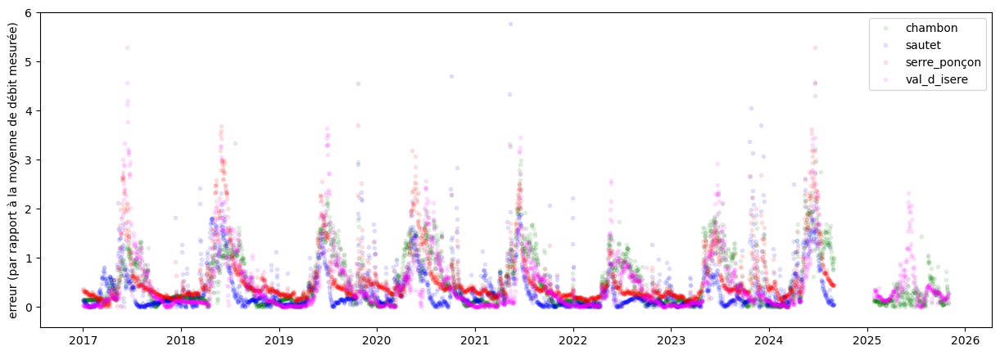

In [26]:
plt.figure(figsize = (15, 5))
colors = ["green", "blue", "red", "magenta", "black"]
i = 0
for coords, c in zip(coordonnesLacs[:-1], listCentrales[:-1]) :
    for f in listFile :
        flow = efasDict[f].sel(latitude = coords[1], longitude = coords[0], method = "nearest").resample(valid_time = '1D').mean()
        dates = sorted(list(set(mesuresDict[c[:-4]]['Date (TU)'].values) & set(flow.valid_time.values)))
        select_flow = flow.sel(valid_time=dates)
        select_mesures = mesuresDict[c[:-4]][mesuresDict[c[:-4]]['Date (TU)'].isin(pd.to_datetime(dates).tz_localize('UTC'))]
        plt.plot(dates, ((np.array(select_flow.dis06.values) - np.array(select_mesures['Valeur (en m³/s)']))**2)**0.5/np.mean(np.array(mesuresDict[c[:-4]]['Valeur (en m³/s)'])), '.', alpha = 0.1, color = colors[i], label=listCentrales[i][:-4] if f == listFile[0] else "")
    i += 1

plt.ylim(top = 6)
plt.legend()
plt.ylabel("erreur (par rapport à la moyenne de débit mesurée)")

In [27]:
gdf = gpd.read_file("./GDW_v1_0_shp/GDW_reservoirs_v1_0.shp")
filtered = gdf[gdf["DAM_NAME"] == "Le Sautet"]

upperLeft = (44.769371595340495, 5.9) 
lowerRight = (44.82612949721342, 6)

In [28]:
#recupere la liste de toutes les tuiles de la zone télechargées
listFiles = os.listdir("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/")

In [29]:
transformer31 = Transformer.from_crs("EPSG:4326", "EPSG:32631") 
transformer32 = Transformer.from_crs("EPSG:4326", "EPSG:32632") 

In [30]:
#permet de recuperer les coordonnées du lac du Sautet pour les 2 phases orbiatales, pour ensuite calculer la hauteur du lac

for file in listFiles :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM31T':
            (xmin, ymin) = transformer31.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer31.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32631).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_31 = X.flatten()[mask]
            Y_in_31 = Y.flatten()[mask]
            break 

for file in listFiles :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM32T':
            (xmin, ymin) = transformer32.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer32.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32632).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_32 = X.flatten()[mask]
            Y_in_32 = Y.flatten()[mask]
            break 

In [31]:
dateS = [] #permet de recalculer les altimetrie du lac
levelS = []
uncertS = []
for file in tqdm(listFiles) :
    if ('.nc' == file[-3:]):
        if file.split('_')[5] == 'UTM31T':
            X_lake = X_in_31
            Y_lake = Y_in_31
        else :
            X_lake = X_in_32
            Y_lake = Y_in_32

        temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
        dateS.append(datetime.datetime.strptime(file.split("_")[14], "%Y%m%dT%H%M%S"))
        wseList = []
        uncertList = []
        for x_i, y_i in zip(X_lake, Y_lake) :
            wseList.append(temp.sel(x = x_i, y = y_i).wse.values)
            uncertList.append(temp.sel(x = x_i, y = y_i).wse_uncert.values)
            if (wseList[-1] > 765) | (wseList[-1] < 725) :
                wseList = wseList[:-1]
                uncertList = uncertList[:-1]
        levelS.append(np.nanmean(np.array(wseList)))
        uncertS.append(np.nanmean(np.array(uncertList)))

 51%|█████▏    | 1633/3184 [03:00<02:59,  8.66it/s]C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\1616563889.py:23: RuntimeWarning: Mean of empty slice
  levelS.append(np.nanmean(np.array(wseList)))
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\1616563889.py:24: RuntimeWarning: Mean of empty slice
  uncertS.append(np.nanmean(np.array(uncertList)))
 52%|█████▏    | 1645/3184 [03:01<02:58,  8.64it/s]C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\1616563889.py:23: RuntimeWarning: Mean of empty slice
  levelS.append(np.nanmean(np.array(wseList)))
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\1616563889.py:24: RuntimeWarning: Mean of empty slice
  uncertS.append(np.nanmean(np.array(uncertList)))
100%|██████████| 3184/3184 [05:51<00:00,  9.05it/s]


Text(0.5, 1.0, 'lac du sautet')

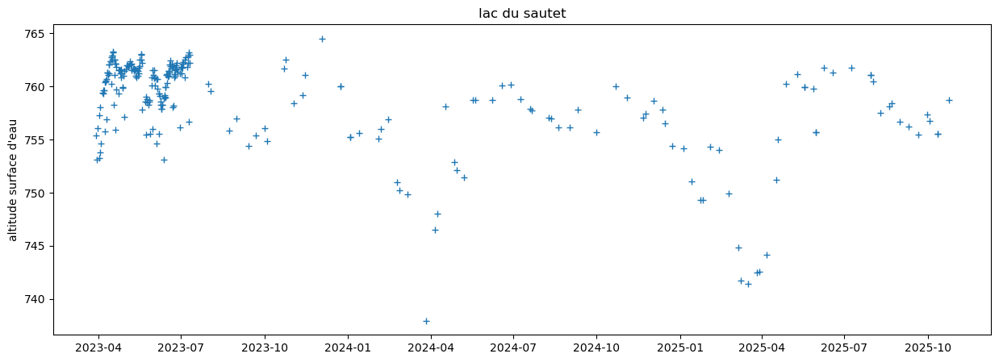

In [38]:
dateS = np.array(dateS)
levelS = np.array(levelS)
order = np.argsort(dateS)
dateS = dateS[order]
levelS = levelS[order]
df = pd.DataFrame({'date': dateS, 'level': levelS})
df['day'] = df['date'].dt.date 
df_unique = df.groupby('day').first().reset_index()  

dateS_unique = df_unique['date'].values
levelS_unique = df_unique['level'].values

plt.figure(figsize = (15, 5))
plt.plot(dateS, levelS, '+')
plt.ylabel("altitude surface d'eau")
plt.title("lac du sautet")

In [33]:
dateS_unique

array(['2023-03-29T00:23:06.000000000', '2023-03-30T00:13:44.000000000',
       '2023-03-31T00:04:21.000000000', '2023-04-01T23:45:37.000000000',
       '2023-04-02T23:36:15.000000000', '2023-04-03T23:26:52.000000000',
       '2023-04-04T23:17:30.000000000', '2023-04-05T23:08:08.000000000',
       '2023-04-06T22:58:46.000000000', '2023-04-07T22:49:24.000000000',
       '2023-04-08T22:40:02.000000000', '2023-04-09T22:30:41.000000000',
       '2023-04-10T22:21:19.000000000', '2023-04-11T22:11:57.000000000',
       '2023-04-12T22:02:35.000000000', '2023-04-13T21:53:13.000000000',
       '2023-04-14T21:43:51.000000000', '2023-04-15T21:34:29.000000000',
       '2023-04-16T21:25:07.000000000', '2023-04-17T21:15:45.000000000',
       '2023-04-18T21:06:22.000000000', '2023-04-19T20:57:00.000000000',
       '2023-04-20T20:47:38.000000000', '2023-04-21T20:38:16.000000000',
       '2023-04-22T20:28:54.000000000', '2023-04-23T20:19:32.000000000',
       '2023-04-24T20:10:10.000000000', '2023-04-25

Text(0, 0.5, "altimetrie surface d'eau")

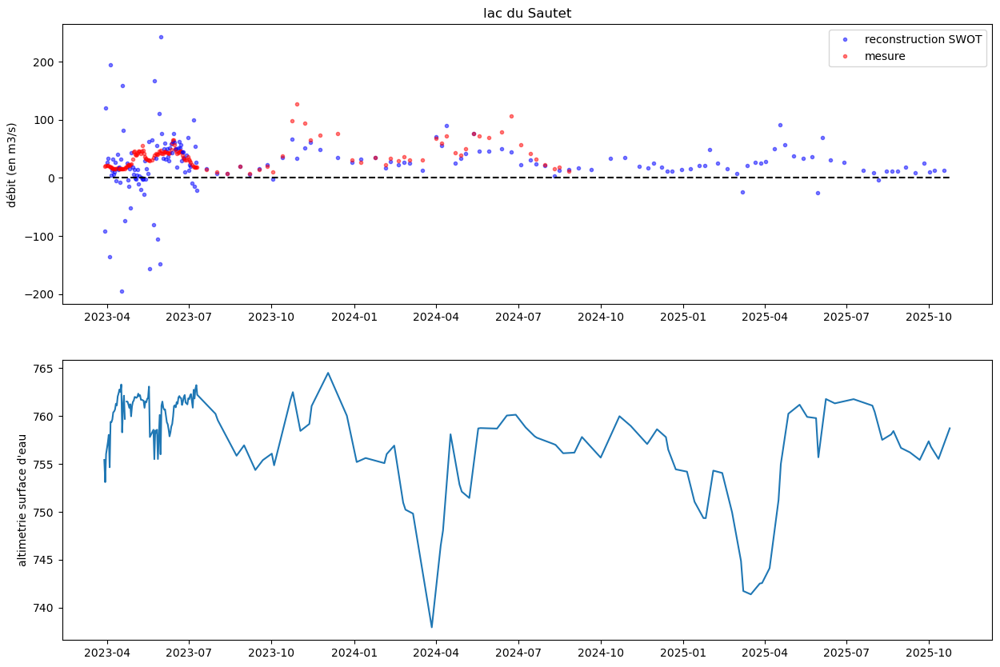

In [34]:
p_turbine = prodCentrales[listProd[0]]
fig, ax = plt.subplots(2, 1, figsize = (15, 10))
mae = 0
rmse = 0
mesure = []
recalcule = []

for i in range(len(dateS_unique) - 1) :
    initDate = dateS_unique[i]
    finalDate = dateS_unique[i + 1]
    initDate = pd.Timestamp(initDate).tz_localize('UTC').tz_convert('Europe/Paris')
    finalDate = pd.Timestamp(finalDate).tz_localize('UTC').tz_convert('Europe/Paris')
    deltaVol = (levelS_unique[i + 1] - levelS_unique[i])*3500000
    q_turbine = sum(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])/76.5*102/len(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])
    ax[0].plot(initDate + (finalDate - initDate) / 2, deltaVol/((finalDate - initDate)/ np.timedelta64(1, 's')) + q_turbine, '.b', label = "reconstruction SWOT" if i ==0 else "", alpha = 0.5)
    reducedDict = mesuresDict['sautet'][(mesuresDict['sautet']['Date (TU)']>= initDate) & (mesuresDict['sautet']['Date (TU)']<finalDate)]
    ax[0].plot(initDate + (finalDate - initDate) / 2, np.mean(reducedDict['Valeur (en m³/s)']), '.r', label = "mesure" if i ==0 else "", alpha = 0.5)
    if dateS_unique[i] > np.datetime64('2023-07-10T00:00:00.000000000') :
        mesure.append(np.mean(reducedDict['Valeur (en m³/s)']))
        recalcule.append(deltaVol/((finalDate - initDate)/ np.timedelta64(1, 's')) + q_turbine)


ax[0].plot([dateS_unique.min(), dateS_unique.max()], [0, 0], "--", color = "black")
ax[0].legend()
ax[0].set_ylabel("débit (en m3/s)")
ax[1].plot(dateS_unique, levelS_unique)
ax[0].set_title("lac du Sautet")
ax[1].set_ylabel("altimetrie surface d'eau")

Text(0.5, 1.0, 'barrage du sautet')

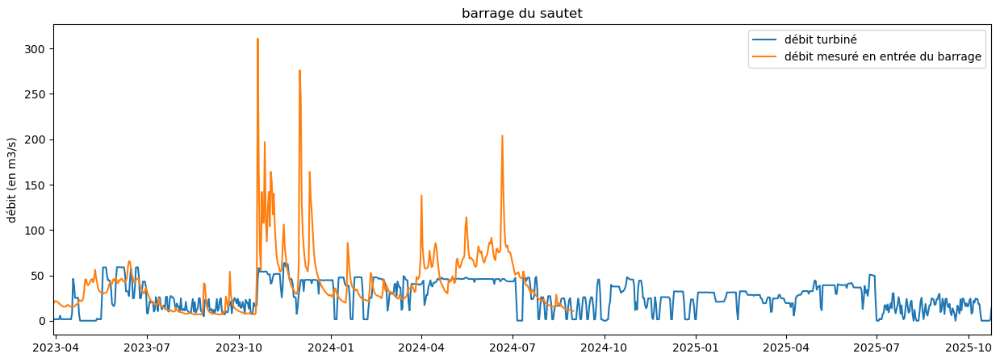

In [37]:
plt.figure(figsize = (15, 5))
plt.plot(p_turbine.resample('D').mean().index, p_turbine.resample('D').mean().values/76.5*102)
plt.plot(mesuresDict['sautet']['Date (TU)'], mesuresDict['sautet']['Valeur (en m³/s)'])
plt.xlim(dateS_unique.min(), dateS_unique.max())
plt.legend(["débit turbiné", "débit mesuré en entrée du barrage"])
plt.ylabel("débit (en m3/s)")
plt.title("barrage du sautet")

In [ ]:
filtered = gdf[gdf["DAM_NAME"] == "Serre Poncon"] #même processus pour le lac de serre poncon

upperLeft = (44.42181609071576, 6.236050932868329)
lowerRight = (44.563617958065656, 6.478347626616325) 

In [ ]:
for file in listFiles[1:] :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM31T':
            (xmin, ymin) = transformer31.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer31.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32631).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_31 = X.flatten()[mask]
            Y_in_31 = Y.flatten()[mask]
            break 

for file in listFiles :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM32T':
            (xmin, ymin) = transformer32.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer32.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32632).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_32 = X.flatten()[mask]
            Y_in_32 = Y.flatten()[mask]
            break 

In [ ]:
dateSP = [] #permet de recalculer les altimetrie du lac
levelSP = []
uncertSP = []
for file in tqdm(listFiles) :
    if ('.nc' == file[-3:]) & (file.split('_')[5] == 'UTM32T'): # c'est pas vraiment les bonnes tuiles d'ou le filtre un peu bizarre
        if file.split('_')[5] == 'UTM31T':
            X_lake = X_in_31
            Y_lake = Y_in_31
        else :
            X_lake = X_in_32
            Y_lake = Y_in_32

        temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
        dateSP.append(datetime.datetime.strptime(file.split("_")[14], "%Y%m%dT%H%M%S"))
        wseList = []
        uncertList = []
        for x_i, y_i in zip(X_lake, Y_lake) :
            wseList.append(temp.sel(x = x_i, y = y_i).wse.values)
            uncertList.append(temp.sel(x = x_i, y = y_i).wse_uncert.values)
            if (wseList[-1] > 780) | (wseList[-1] < 722) :
                wseList = wseList[:-1]
                uncertList = uncertList[:-1]
        levelSP.append(np.nanmean(np.array(wseList)))
        uncertSP.append(np.nanmean(np.array(uncertList)))

In [ ]:
dateSP = np.array(dateSP)
levelSP = np.array(levelSP)
order = np.argsort(dateSP)
dateSP = dateSP[order]
levelSP = levelSP[order]
df = pd.DataFrame({'date': dateSP, 'level': levelSP})
df['day'] = df['date'].dt.date 
df_unique = df.groupby('day').first().reset_index()  

dateSP_unique = df_unique['date'].values
levelSP_unique = df_unique['level'].values

plt.figure(figsize = (15, 5))
plt.plot(dateSP, levelSP, '+')
plt.plot(dateSP_unique, levelSP_unique, '+')
plt.legend(["SWOT", "sous échantillonage"])
plt.ylabel("altitude surface d'eau")
plt.title("lac de serre poncon")

In [ ]:
p_turbine = prodCentrales[listProd[2]]
fig, ax = plt.subplots(2, 1, figsize = (15, 10))

for i in range(len(dateSP_unique) - 1) :
    initDate = dateSP_unique[i]
    finalDate = dateSP_unique[i + 1]
    initDate = pd.Timestamp(initDate).tz_localize('UTC').tz_convert('Europe/Paris')
    finalDate = pd.Timestamp(finalDate).tz_localize('UTC').tz_convert('Europe/Paris')
    deltaVol = (levelSP_unique[i + 1] - levelSP_unique[i])*28200000 
    q_turbine = sum(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])/370*375/len(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])
    ax[0].plot(initDate + (finalDate - initDate) / 2, deltaVol/((finalDate - initDate)/ np.timedelta64(1, 's')) + q_turbine, '.b', label = "reconstruction SWOT" if i ==0 else "", alpha = 0.5)
    reducedDict = mesuresDict['serre_ponçon'][(mesuresDict['serre_ponçon']['Date (TU)']>= initDate) & (mesuresDict['serre_ponçon']['Date (TU)']<finalDate)]
    ax[0].plot(initDate + (finalDate - initDate) / 2, np.mean(reducedDict['Valeur (en m³/s)']), '.r', label = "mesure" if i ==0 else "", alpha = 0.5)

ax[0].plot([dateSP_unique.min(), dateSP_unique.max()], [0, 0], "--", color = "black")
ax[0].legend()
ax[0].set_ylabel("débit (en m3/s)")
ax[1].plot(dateSP_unique, levelSP_unique)
ax[0].set_title("lac de Serre Poncon")
ax[1].set_ylabel("altimetrie surface d'eau")
ax[0].set_ylim(-500, 500)

In [ ]:
filtered = gdf[gdf["DAM_NAME"] == "Le Chambon"] #même processus pour le lac de serre poncon

upperLeft = (45.02843889330232, 6.133026548464677)
lowerRight = (45.051183987564315, 6.190199160425056) 

In [ ]:
for file in listFiles[1:] :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM31T':
            (xmin, ymin) = transformer31.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer31.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32631).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_31 = X.flatten()[mask]
            Y_in_31 = Y.flatten()[mask]
            break 

for file in listFiles :
    if '.nc' == file[-3:] :
        if file.split('_')[5] == 'UTM32T':
            (xmin, ymin) = transformer32.transform(upperLeft[0], upperLeft[1])
            (xmax, ymax) = transformer32.transform(lowerRight[0], lowerRight[1])
            temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
            tempReduced = temp["wse"].where((temp.x > xmin) & (temp.x < xmax) & (temp.y > ymin) & (temp.y < ymax), drop = True)
            X, Y = np.meshgrid(tempReduced.x.values, tempReduced.y.values)
            pts = [Point(x, y) for x, y in zip(X.flatten(), Y.flatten())]
            polygon = filtered.to_crs(epsg=32632).iloc[0].geometry
            mask = [polygon.contains(pt) for pt in pts]
            
            X_in_32 = X.flatten()[mask]
            Y_in_32 = Y.flatten()[mask]
            break 

In [ ]:
dateC = [] #permet de recalculer les altimetrie du lac
levelC = []
uncertC = []
for file in tqdm(listFiles) :
    if ('.nc' == file[-3:]) & (file.split('_')[5] == 'UTM32T'):
        if file.split('_')[5] == 'UTM31T':
            X_lake = X_in_31
            Y_lake = Y_in_31
        else :
            X_lake = X_in_32
            Y_lake = Y_in_32

        temp = xr.open_dataset("C:/Users/paoliniart/Documents/SWOT_Level_2_HR_Raster_100m/" + file)
        dateC.append(datetime.datetime.strptime(file.split("_")[14], "%Y%m%dT%H%M%S"))
        wseList = []
        uncertList = []
        for x_i, y_i in zip(X_lake, Y_lake) :
            wseList.append(temp.sel(x = x_i, y = y_i).wse.values)
            uncertList.append(temp.sel(x = x_i, y = y_i).wse_uncert.values)
            if (wseList[-1] > 1040) | (wseList[-1] < 980) :
                wseList = wseList[:-1]
                uncertList = uncertList[:-1]
        levelC.append(np.nanmean(np.array(wseList)))
        uncertC.append(np.nanmean(np.array(uncertList)))

In [ ]:
dateC = np.array(dateC)
levelC = np.array(levelC)
order = np.argsort(dateC)
dateC = dateC[order]
levelC = levelC[order]
df = pd.DataFrame({'date': dateC, 'level': levelC})
df['day'] = df['date'].dt.date 
df_unique = df.groupby('day').first().reset_index()  

dateC_unique = df_unique['date'].values
levelC_unique = df_unique['level'].values

plt.figure(figsize = (15, 5))
plt.plot(dateC, levelC, '+')
plt.plot(dateC_unique, levelC_unique, '+')
plt.legend(["SWOT", "sous échantillonage"])
plt.ylabel("altitude surface d'eau")
plt.title("lac du chambon")

In [ ]:
p_turbine = prodCentrales[listProd[1]]
fig, ax = plt.subplots(2, 1, figsize = (15, 10))

for i in range(len(dateC_unique) - 1) :
    initDate = dateC_unique[i]
    finalDate = dateC_unique[i + 1]
    initDate = pd.Timestamp(initDate).tz_localize('UTC').tz_convert('Europe/Paris')
    finalDate = pd.Timestamp(finalDate).tz_localize('UTC').tz_convert('Europe/Paris')
    deltaVol = (levelC_unique[i + 1] - levelC_unique[i])*1400000 
    q_turbine = sum(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])/116*22.5/len(p_turbine[(p_turbine.index >= initDate) & (p_turbine.index < finalDate)])
    ax[0].plot(initDate + (finalDate - initDate) / 2, deltaVol/((finalDate - initDate)/ np.timedelta64(1, 's')) + q_turbine, '.b', label = "reconstruction SWOT" if i ==0 else "", alpha = 0.5)
    reducedDict = mesuresDict['chambon'][(mesuresDict['chambon']['Date (TU)']>= initDate) & (mesuresDict['chambon']['Date (TU)']<finalDate)]
    ax[0].plot(initDate + (finalDate - initDate) / 2, np.mean(reducedDict['Valeur (en m³/s)']), '.r', label = "mesure" if i ==0 else "", alpha = 0.5)

ax[0].plot([dateC_unique.min(), dateC_unique.max()], [0, 0], "--", color = "black")
ax[0].legend()
ax[0].set_ylabel("débit (en m3/s)")
ax[1].plot(dateC_unique, levelC_unique)
ax[0].set_title("lac du Chambon")
ax[1].set_ylabel("altimetrie surface d'eau")
ax[0].set_ylim(-50, 50)


In [ ]:
p_turbine = prodCentrales[listProd[1]]

In [ ]:
plt.figure(figsize = (15, 5))
p_turbine = p_turbine.resample('D').mean()
plt.plot(p_turbine.index, p_turbine.values)
plt.xlim(dateC_unique.min(), dateC_unique.max())

In [3]:
debit = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques-depuis-2001.csv")
debit_histo = pd.read_csv("debit-des-rivieres-aux-abords-de-centrales-hydrauliques.csv")

In [4]:
stations = debit_histo["libelle"].drop_duplicates()

In [5]:
mesureEDF = []
for s in stations :
    mesureEDF.append(pd.Series(list(debit_histo[debit_histo["libelle"] == s]["avant_filtre_na"].values) + list(debit[debit["Périmètre spatial"] == s]["Débit"].values), index = list(debit_histo[debit_histo["libelle"] == s]["date"].values) + list(debit[debit["Périmètre spatial"] == s]["Date"].values), name = s))

In [6]:
df = pd.concat(mesureEDF, axis=1)
df.sort_index(inplace=True)
df.to_csv("debit_fournis_EDF_1916-2024.csv")

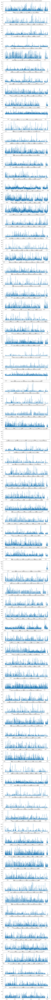

In [7]:
fig, ax = plt.subplots(len(stations), 1, figsize = (12, 3*len(stations)))

for i in range(len(stations)) :
    ax[i].plot(pd.to_datetime(df.index), df[list(stations)[i]])
    ax[i].set_title(list(stations)[i])


In [8]:
histo_stat = debit_histo["point_geo"].drop_duplicates().values

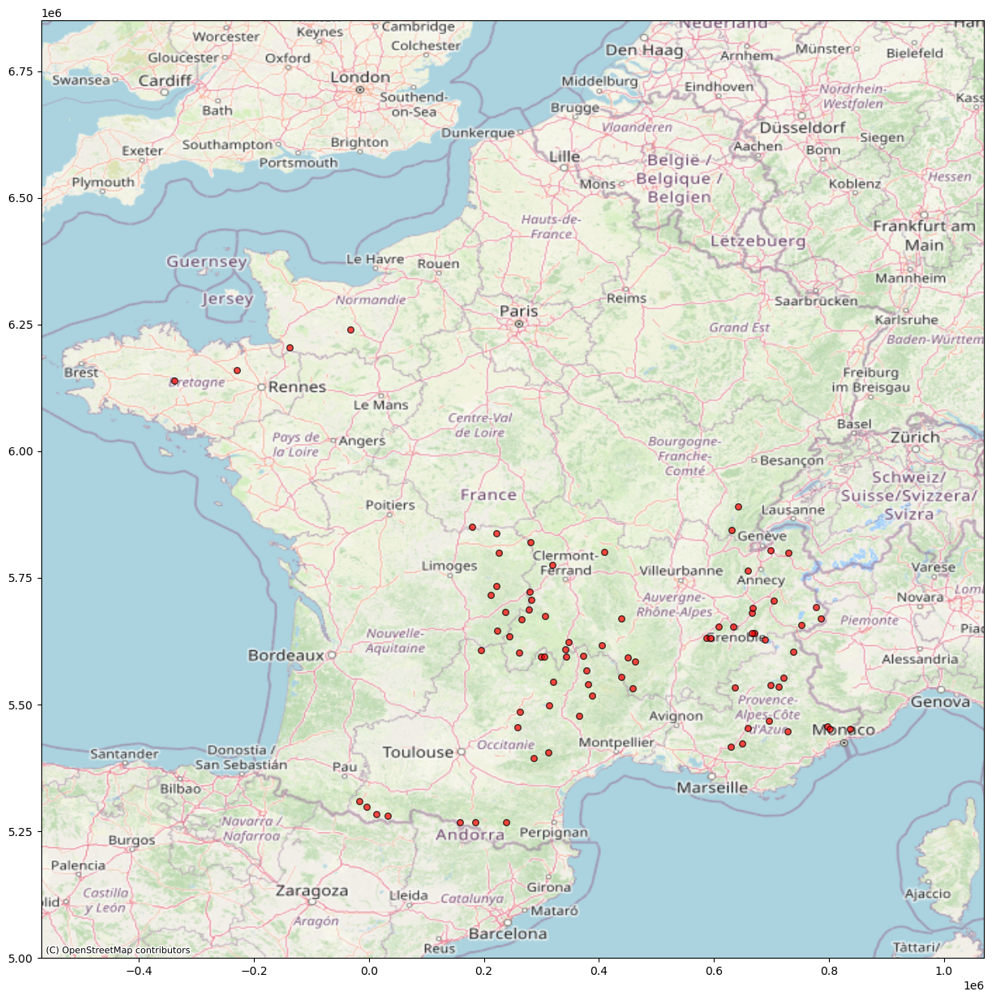

In [9]:
lats = []
lons = []
for entry in histo_stat:
    lat, lon = map(float, entry.split(','))
    lats.append(lat)
    lons.append(lon)

# Conversion lat/lon -> Web Mercator (EPSG:3857)
proj = pyproj.Transformer.from_crs(4326, 3857, always_xy=True)
x, y = proj.transform(lons, lats)



fig, ax = plt.subplots(1, 1, figsize = (15, 15))
xmin, xmax = -570000, 1070000    # x: Ouest, Est en mètres
ymin, ymax = 5000000, 6850000    # y: Sud, Nord en mètres

ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

cx.add_basemap(ax, crs='EPSG:3857', source=cx.providers.OpenStreetMap.Mapnik, zoom=6)
ax.scatter(x, y, c='red', s=30, edgecolor='black', alpha=0.7, zorder=2)


plt.show()

In [10]:
efasList = ['EFAS_historical_2001_Isere.nc',
 'EFAS_historical_2002_Isere.nc',
 'EFAS_historical_2003_Isere.nc',
 'EFAS_historical_2004_Isere.nc',
 'EFAS_historical_2005_Isere.nc',
 'EFAS_historical_2006_Isere.nc',
 'EFAS_historical_2007_Isere.nc',
 'EFAS_historical_2008_Isere.nc',
 'EFAS_historical_2009_Isere.nc',
 'EFAS_historical_2010_Isere.nc',
 'EFAS_historical_2011_Isere.nc',
 'EFAS_historical_2012_Isere.nc',
 'EFAS_historical_2013_Isere.nc',
 'EFAS_historical_2014_Isere.nc',
 'EFAS_historical_2015_Isere.nc',
 'EFAS_historical_2016_Isere.nc',
 'EFAS_historical_2017_Isere.nc',
 'EFAS_historical_2018_Isere.nc',
 'EFAS_historical_2019_Isere.nc',
 'EFAS_historical_2020_Isere.nc',
 'EFAS_historical_2021_Isere.nc',
 'EFAS_historical_2022_Isere.nc',
 'EFAS_historical_2023_Isere.nc',
 'EFAS_historical_2024_Isere.nc',
 'EFAS_historical_2025_Isere.nc']

loc_centrale = pd.read_excel("C:/Users/paoliniart/Documents/Arthur_thèse hydro/données/INFOS_CENTRALES.xlsx")

In [11]:
dictCentralesIsere = {'RANDEH': {'P': np.float64(124.0), 'Q': np.float64(120.0)},
 'VLARDH': {'P': np.float64(8.7), 'Q': np.float64(10.0)},
 'GERVAH': {'P': np.float64(116.0), 'Q': np.float64(1600.0)},
 'MTEYNH': {'P': np.float64(366.0), 'Q': np.float64(338.0)},
 'SSHILH': {'P': np.float64(38.0), 'Q': np.float64(510.0)},
 'GIROTH': {'P': np.float64(8.51), 'Q': np.float64(7.0)},
 'GLANDH': {'P': np.float64(11.8), 'Q': np.float64(5.0)},
 'ORELLH': {'P': np.float64(71.68), 'Q': np.float64(70.0)},
 'OZ   H': {'P': np.float64(12.2), 'Q': np.float64(32.0)},
 'CTLARH': {'P': np.float64(14.0), 'Q': np.float64(2.0)},
 'L.MORH': {'P': np.float64(8.9), 'Q': np.float64(2.0)},
 'S.BISHP': {'P': np.float64(740.0), 'Q': np.float64(80.0)},
 'SASSEH': {'P': np.float64(10.53), 'Q': np.float64(2.0)},
 'SAUCEH': {'P': np.float64(18.0), 'Q': np.float64(21.0)},
 'SAUS2H': {'P': np.float64(145.4), 'Q': np.float64(90.0)},
 'VLAROH': {'P': np.float64(357.0), 'Q': np.float64(51.0)},
 'G.MAIHP': {'P': np.float64(1690.0), 'Q': np.float64(216.0)},
 'P.GIRH': {'P': np.float64(6.2), 'Q': np.float64(3.0)},
 'CORDEH': {'P': np.float64(57.4), 'Q': np.float64(84.0)},
 'SAUTEH': {'P': np.float64(76.5), 'Q': np.float64(102.0)},
 'VICLAH': {'P': np.float64(9.6), 'Q': np.float64(3.0)},
 'MIZOEH': {'P': np.float64(5.0), 'Q': np.float64(1.0)},
 'CHEY6H': {'P': np.float64(485.0), 'Q': np.float64(230.0)},
 'PERR5H': {'P': np.float64(1.88), 'Q': np.float64(1.0)},
 'BREVIHP': {'P': np.float64(96.0), 'Q': np.float64(48.0)},
 'P.ESCH': {'P': np.float64(51.3), 'Q': np.float64(17.0)},
 'BREVIH': {'P': np.float64(96.0), 'Q': np.float64(48.0)},
 'MALGOH': {'P': np.float64(297.0), 'Q': np.float64(50.0)},
 'COCHEH': {'P': np.float64(384.0), 'Q': np.float64(41.0)},
 'COCHEHP': {'P': np.float64(384.0), 'Q': np.float64(41.0)},
 'PIZANH': {'P': np.float64(42.0), 'Q': np.float64(510.0)},
 'POMBLH': {'P': np.float64(13.55), 'Q': np.float64(24.0)},
 'VAUG5H': {'P': np.float64(61.0), 'Q': np.float64(1400.0)},
 'VERN7H': {'P': np.float64(21.8), 'Q': np.float64(8.0)},
 'SABLOH': {'P': np.float64(160.0), 'Q': np.float64(1600.0)},
 'SSGUIH': {'P': np.float64(116.0), 'Q': np.float64(22.5)},
 'BOZELH': {'P': np.float64(9.6), 'Q': np.float64(2.0)},
 'V.ISEH': {'P': np.float64(18.0), 'Q': np.float64(10.0)},
 'BRIDOH': {'P': np.float64(8.75), 'Q': np.float64(7.0)},
 'CHEVRH': {'P': np.float64(20.1), 'Q': np.float64(6.0)},
 'VNOTAH': {'P': np.float64(33.0), 'Q': np.float64(20.0)},
 'D.INFH': {'P': np.float64(10.1), 'Q': np.float64(80.0)},
 'BXFORH': {'P': np.float64(22.0), 'Q': np.float64(11.0)},
 'B.MONH': {'P': np.float64(40.0), 'Q': np.float64(480.0)},
 'RAGEAH': {'P': np.float64(12.5), 'Q': np.float64(4.0)},
 'BVIL6H': {'P': np.float64(40.6), 'Q': np.float64(10.0)},
 'AVRIEH': {'P': np.float64(11.4), 'Q': np.float64(16.0)},
 'B.AUSHP': {'P': np.float64(0.0), 'Q': np.float64(1.0)},
 'BENS H': {'P': np.float64(8.55), 'Q': np.float64(2.0)},
 'VANELH': {'P': np.float64(29.0), 'Q': np.float64(530.0)},
 'CALYPH': {'P': np.float64(19.8), 'Q': np.float64(4.0)},
 'FEISSH': {'P': np.float64(12.91), 'Q': np.float64(2.0)},
 'P.ROYH': {'P': np.float64(23.0), 'Q': np.float64(28.0)},
 'G.MAIH': {'P': np.float64(1690.0), 'Q': np.float64(216.0)},
 'L.NEUHCP': {'P': np.float64(210.0), 'Q': np.float64(2100.0)},
 'CHAMPH': {'P': np.float64(15.2), 'Q': np.float64(95.0)},
 'BATHIH': {'P': np.float64(600.0), 'Q': np.float64(48.0)},
 'BATONH': {'P': np.float64(4.8), 'Q': np.float64(1.0)},
 'BOUVAH': {'P': np.float64(9.0), 'Q': np.float64(4.0)},
 'SSBERH': {'P': np.float64(13.6), 'Q': np.float64(14.0)},
 'SSCOGH': {'P': np.float64(100.0), 'Q': np.float64(145.0)},
 'SSCOMH': {'P': np.float64(60.8), 'Q': np.float64(90.0)},
 'C.RHOH': {'P': np.float64(285.0), 'Q': np.float64(2200.0)},
 'HERMIH': {'P': np.float64(115.6), 'Q': np.float64(90.0)},
 'PTCH5H': {'P': np.float64(10.67), 'Q': np.float64(9.0)},
 'MOUTIH': {'P': np.float64(4.5), 'Q': np.float64(24.0)},
 'F.FRAH': {'P': np.float64(35.1), 'Q': np.float64(4.0)},
 'MOTZ H': {'P': np.float64(33.6), 'Q': np.float64(110.0)},
 'QUEIGH': {'P': np.float64(8.8), 'Q': np.float64(13.0)},
 'BXVOIH': {'P': np.float64(39.0), 'Q': np.float64(510.0)},
 'P.VIZH': {'P': np.float64(46.3), 'Q': np.float64(41.0)},
 'HAUT5H': {'P': np.float64(14.76), 'Q': np.float64(11.0)},
 'BISSOH': {'P': np.float64(76.0), 'Q': np.float64(8.0)},
 'ARVANH': {'P': np.float64(29.0), 'Q': np.float64(7.0)},
 'S.BISH': {'P': np.float64(740.0), 'Q': np.float64(80.0)},
 'B.VALH': {'P': np.float64(186.0), 'Q': np.float64(2100.0)},
 'ARLY H': {'P': np.float64(35.0), 'Q': np.float64(12.0)},
 'C.AVRH': {'P': np.float64(122.0), 'Q': np.float64(16.0)},
 'BATH5H': {'P': np.float64(2.5), 'Q': np.float64(1.0)},
 'L.MORHRE2': {'P': np.float64(8.9), 'Q': np.float64(2.0)},
 'CHEY6HP': {'P': np.float64(485.0), 'Q': np.float64(230.0)}}

In [12]:
def PointOnRiver(coords, dis06_mean, antiSurf = 2) :

    lat_min, lat_max = np.min(dis06_mean["latitude"].values), np.max(dis06_mean["latitude"].values)
    lon_min, lon_max = np.min(dis06_mean["longitude"].values), np.max(dis06_mean["longitude"].values)
    if not (lat_min <= coords[1] <= lat_max and lon_min <= coords[0] <= lon_max):
        return ()
    
    lat_idx = np.abs(dis06_mean['latitude'].values - coords[1]).argmin()
    lon_idx = np.abs(dis06_mean['longitude'].values - coords[0]).argmin()
    lat_slice = slice(max(0, lat_idx-1), min(lat_idx+2, len(dis06_mean['latitude'])))
    lon_slice = slice(max(0, lon_idx-1), min(lon_idx+2, len(dis06_mean['longitude'])))
    sub = dis06_mean.isel(latitude=lat_slice, longitude=lon_slice)
    ind_max = np.unravel_index(np.nanargmax(sub.values), sub.shape)  ##recherche de maximum dans un tableau a 2 dimensions
    lat_max = sub['latitude'].values[ind_max[0]]
    lon_max = sub['longitude'].values[ind_max[1]]
    if dis06_mean.sel(latitude = lat_max, longitude = lon_max) < antiSurf*dis06_mean.isel(latitude = lat_idx, longitude = lon_idx) : ##ne modifie les coordonnées de la station que si il existe une différnece reellement significative (evite que les stations descendent la riviere)
        lat_max = dis06_mean['latitude'].values[lat_idx]
        lon_max = dis06_mean['longitude'].values[lon_idx]

    return (lon_max, lat_max)

C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\95800392.py:14: RuntimeWarning: divide by zero encountered in scalar divide
  multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\95800392.py:15: RuntimeWarning: invalid value encountered in multiply
  dictMAE[(centrale['lon_site'].values[0], centrale['lat_site'].values[0])] = np.mean(abs((pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod")))/(prodCentrales[p].mean()*multiplier))


Text(0.5, 1.0, 'comparaison efas - mesure EDF (NMAE)')

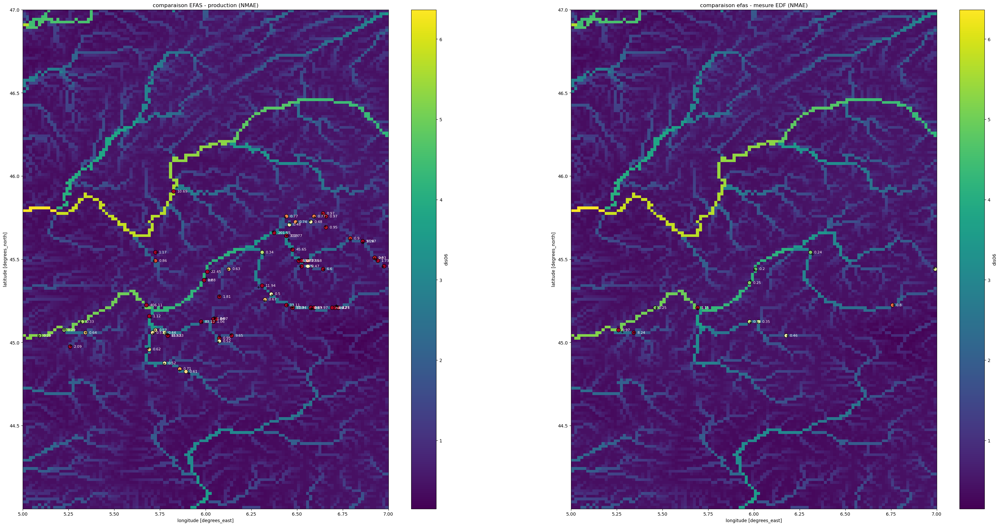

In [13]:
dictMAE = {}
efasTimeseries = xr.concat([xr.open_dataarray("c:/Users/paoliniart/Documents/" + file) for file in efasList], dim = "valid_time", coords = "minimal")
dis06_mean = efasTimeseries.mean("valid_time")
fig, ax = plt.subplots(1, 2, figsize = (40, 20))
(dis06_mean**0.3).plot(ax = ax[0])
for p in prodCentrales.columns :
    centrale = loc_centrale[[p in c for c in loc_centrale["Chroniques"].fillna("")]]
    try :
        if int(centrale["dept"].values[0]) in [73, 38, 26] :
            onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), dis06_mean, antiSurf = 10)

            if onRiver != () :
                efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
                multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
                dictMAE[(centrale['lon_site'].values[0], centrale['lat_site'].values[0])] = np.mean(abs((pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod")))/(prodCentrales[p].mean()*multiplier))
                ax[0].plot(centrale['lon_site'].values[0], centrale['lat_site'].values[0], '+k')
                ax[0].scatter(onRiver[0], onRiver[1], c = [min(1, dictMAE[(centrale['lon_site'].values[0], centrale['lat_site'].values[0])])], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
                ax[0].text(onRiver[0] + 0.02, onRiver[1], str(round(dictMAE[(centrale['lon_site'].values[0], centrale['lat_site'].values[0])], ndigits=2)), va='center', fontsize=8, color='white') 

    except : 
        continue

ax[0].set_title("comparaison EFAS - production (NMAE)")

dictMAEStation = {}
(dis06_mean**0.3).plot(ax = ax[1])
for station in ['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'] :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        dictMAEStation[(lon, lat)] = np.mean(abs((pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - df_station.resample('D').mean())/(df_station.mean())))
        ax[1].plot(lon, lat, 'k+')
        ax[1].scatter(onRiver[0], onRiver[1], c = [min(1, dictMAEStation[(lon, lat)])], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
        ax[1].text(onRiver[0] + 0.02, onRiver[1], str(round(dictMAEStation[(lon, lat)], ndigits=2)), va='center', fontsize=8, color='white')

ax[1].set_title("comparaison efas - mesure EDF (NMAE)")

Text(0, 0.5, 'débit (en m3/s)')

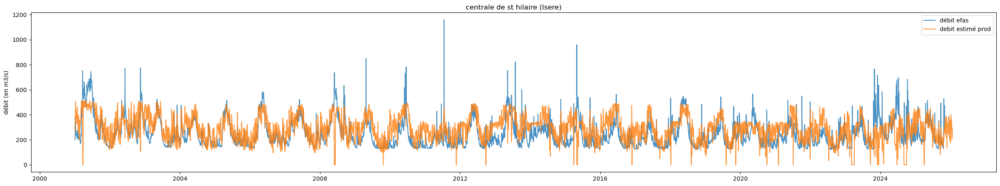

In [14]:
centrale = loc_centrale[["SSHILH" in c for c in loc_centrale["Chroniques"].fillna("")]]
efasVal = xr.concat([xr.open_dataarray("c:/Users/paoliniart/Documents/" + file).sel(latitude = centrale['lat_site'].values, longitude = centrale['lon_site'].values, method = "nearest") for file in efasList], dim = "valid_time", coords = "minimal")
multiplier = dictCentralesIsere["SSHILH"]["Q"]/dictCentralesIsere["SSHILH"]["P"]
efas = pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time.values)
prod = pd.Series(prodCentrales["SSHILH"].resample('D').mean().values*multiplier, index = prodCentrales["SSHILH"].resample('D').mean().index.date, name = "prod")

plt.figure(figsize=(30, 5))
plt.plot(efas.index, efas.values, alpha = 0.8, label = "débit efas")
plt.plot(prod.index, prod.values, alpha = 0.8, label = "debit estimé prod")
plt.title("centrale de st hilaire (Isere)")
plt.legend()
plt.ylabel("débit (en m3/s)")

In [ ]:
mergeSeries = pd.concat([efas, prod], axis = 1).dropna()

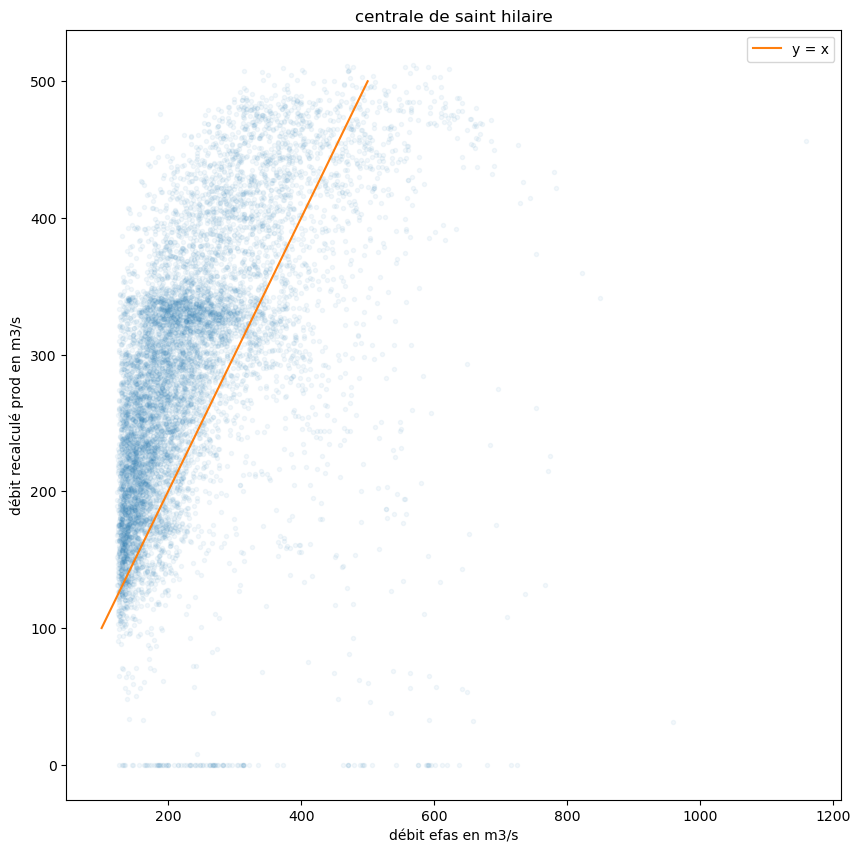

In [ ]:
plt.figure(figsize=(10, 10))
plt.plot(mergeSeries[0], mergeSeries["prod"], '.', alpha = 0.05)
plt.xlabel("débit efas en m3/s")
plt.ylabel("débit recalculé prod en m3/s")
plt.title("centrale de saint hilaire")
plt.plot([100, 500], [100, 500], label = "y = x")
plt.legend()

C:\Users\paoliniart\AppData\Local\Temp\ipykernel_10052\277406055.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_10052\277406055.py:12: RuntimeWarning: invalid value encountered in multiply
  AESerie = abs(pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod"))/(prodCentrales[p].mean()*multiplier)


(0.0, 10.0)

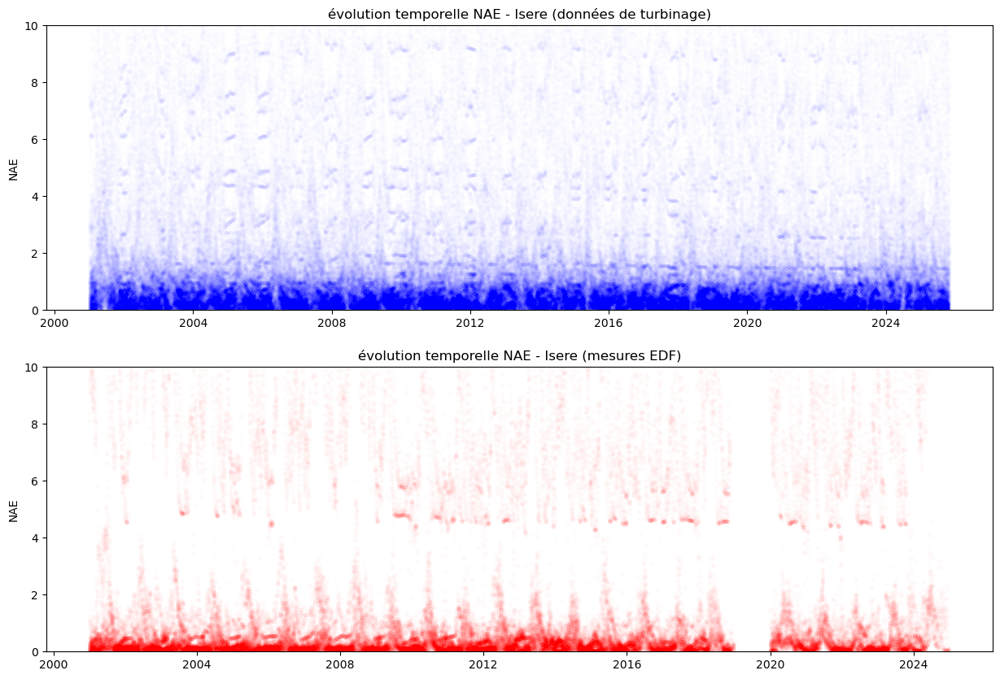

In [ ]:
fig, ax = plt.subplots(2, 1, figsize= (15, 10))
efasTimeseries = xr.concat([xr.open_dataarray("c:/Users/paoliniart/Documents/" + file) for file in efasList], dim = "valid_time")
for p in prodCentrales.columns :
    centrale = loc_centrale[[p in c for c in loc_centrale["Chroniques"].fillna("")]]
    try :
        if int(centrale["dept"].values[0]) in [73, 38, 26] :
            onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), dis06_mean, antiSurf = 10)

            if onRiver != () :
                efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
                multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
                AESerie = abs(pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod"))/(prodCentrales[p].mean()*multiplier)
                ax[0].plot(AESerie.index, AESerie.values, "b.", alpha = 0.005)
    except : 
        continue

ax[0].set_ylabel("NAE")
ax[0].set_title("évolution temporelle NAE - Isere (données de turbinage)")
ax[0].set_ylim(0, 10)


for station in ['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'] :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        AESerie = abs((pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - df_station.resample('D').mean())/(df_station.mean()))
        ax[1].plot(AESerie.index, AESerie.values, "r.", alpha = 0.01)

ax[1].set_ylabel("NAE")
ax[1].set_title("évolution temporelle NAE - Isere (mesures EDF)")
ax[1].set_ylim(0, 10)

C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\2929405418.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_18712\2929405418.py:12: RuntimeWarning: invalid value encountered in multiply
  AESerie = abs(pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod"))/(efasVal.mean("valid_time").values)


(0.0, 5.0)

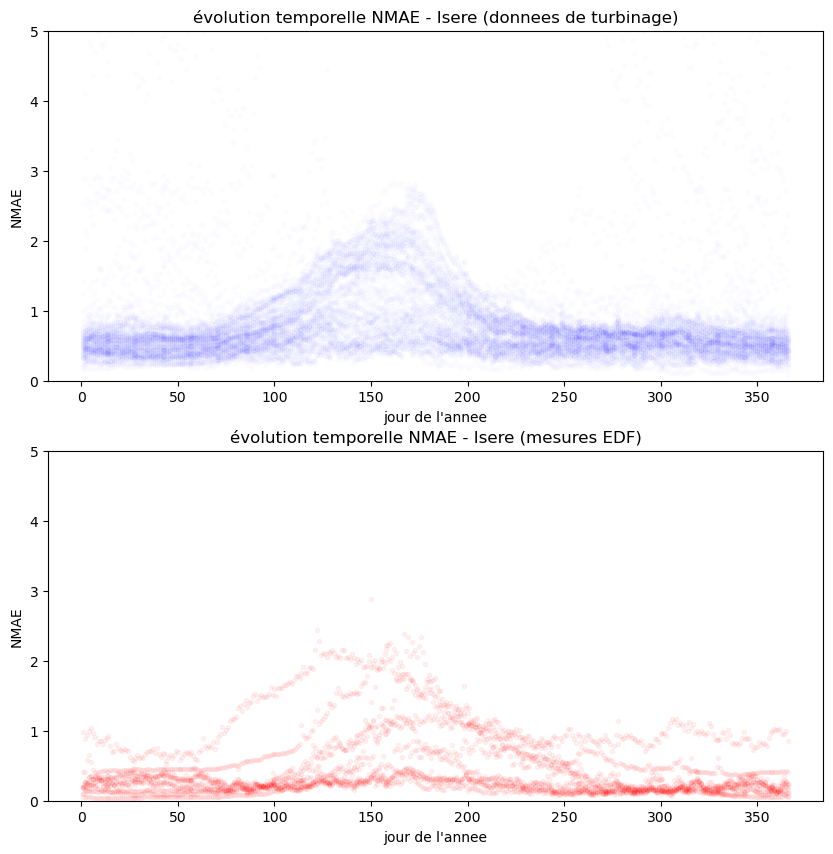

In [15]:
fig, ax = plt.subplots(2, 1, figsize= (10, 10))
efasTimeseries = xr.concat([xr.open_dataarray("c:/Users/paoliniart/Documents/" + file) for file in efasList], dim = "valid_time")
for p in prodCentrales.columns :
    centrale = loc_centrale[[p in c for c in loc_centrale["Chroniques"].fillna("")]]
    try :
        if int(centrale["dept"].values[0]) in [73, 38, 26] :
            onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), dis06_mean, antiSurf = 10)

            if onRiver != () :
                efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
                multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
                AESerie = abs(pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - pd.Series(prodCentrales[p].resample('D').mean().values*multiplier, prodCentrales[p].resample('D').mean().index.date, name = "prod"))/(efasVal.mean("valid_time").values)
                AESerie = AESerie.groupby(AESerie.index.dayofyear).mean()
                ax[0].plot(AESerie.index, AESerie.values, "b.", alpha = 0.008)
    except : 
        continue

ax[0].set_ylabel("NMAE")
ax[0].set_xlabel("jour de l'annee")
ax[0].set_title("évolution temporelle NMAE - Isere (donnees de turbinage)")
ax[0].set_ylim(0, 5)

for station in ['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'] :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        AESerie = abs((pd.Series(efasVal.resample(valid_time = 'D').mean().values.squeeze(), index = efasVal.resample(valid_time = 'D').mean().valid_time) - df_station.resample('D').mean())/(df_station.mean()))
        AESerie = AESerie.groupby(AESerie.index.dayofyear).mean()
        ax[1].plot(AESerie.index, AESerie.values, "r.", alpha = 0.05)

ax[1].set_ylabel("NMAE")
ax[1].set_xlabel("jour de l'annee")
ax[1].set_title("évolution temporelle NMAE - Isere (mesures EDF)")
ax[1].set_ylim(0, 5)


C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\2306844242.py:13: RuntimeWarning: divide by zero encountered in scalar divide
  miss = (prodCentrales[p].mean()*multiplier - efasVal.mean(dim = "valid_time").values)/(prodCentrales[p].mean()*multiplier)
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\2306844242.py:13: RuntimeWarning: divide by zero encountered in scalar divide
  miss = (prodCentrales[p].mean()*multiplier - efasVal.mean(dim = "valid_time").values)/(prodCentrales[p].mean()*multiplier)
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\2306844242.py:12: RuntimeWarning: divide by zero encountered in scalar divide
  multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
C:\Users\paoliniart\AppData\Local\Temp\ipykernel_20184\2306844242.py:13: RuntimeWarning: invalid value encountered in scalar divide
  miss = (prodCentrales[p].mean()*multiplier - efasVal.mean(dim = "valid_time").values)/(prodCentrales[p].mean()*multiplier)
C:\Users\paoliniart\AppDa

Text(0.5, 1.0, "comparaison efas - mesure EDF (part d'eau manquante EFAS)")

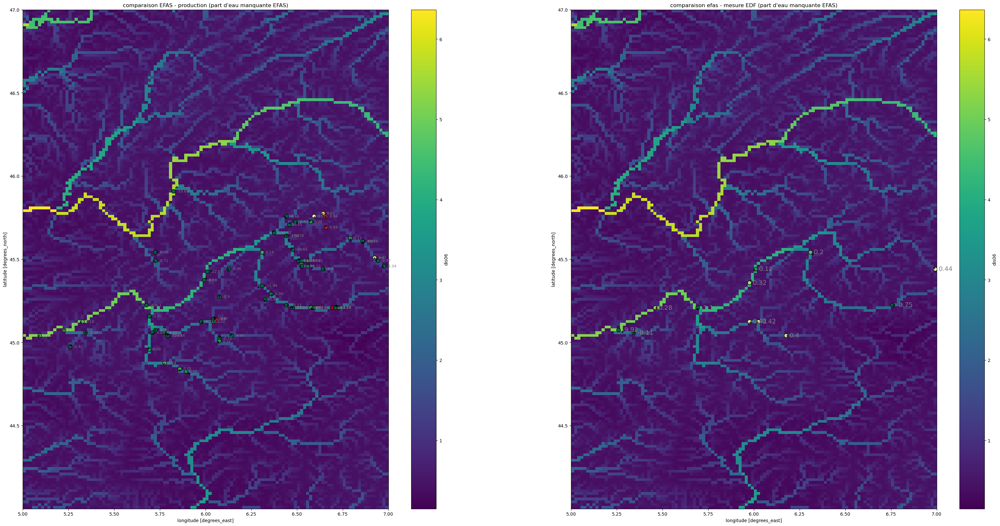

In [15]:
efasTimeseries = xr.concat([xr.open_dataarray("c:/Users/paoliniart/Documents/" + file) for file in efasList], dim = "valid_time", coords = "minimal")
fig, ax = plt.subplots(1, 2, figsize = (40, 20))
(dis06_mean**0.3).plot(ax = ax[0])
for p in prodCentrales.columns :
    centrale = loc_centrale[[p in c for c in loc_centrale["Chroniques"].fillna("")]]
    try :
        if int(centrale["dept"].values[0]) in [73, 38, 26] :
            onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), dis06_mean, antiSurf = 10)

            if onRiver != () :
                efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
                multiplier = dictCentralesIsere[p]["Q"]/dictCentralesIsere[p]["P"]
                miss = (prodCentrales[p].mean()*multiplier - efasVal.mean(dim = "valid_time").values)/(prodCentrales[p].mean()*multiplier)
                ax[0].plot(centrale['lon_site'].values[0], centrale['lat_site'].values[0], '+k')
                ax[0].scatter(onRiver[0], onRiver[1], c = [min(1, miss)], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
                ax[0].text(onRiver[0] + 0.02, onRiver[1], str(round(miss, ndigits=2)), va='center', fontsize=8, color='grey') 

    except : 
        continue

ax[0].set_title("comparaison EFAS - production (part d'eau manquante EFAS)")

dictMAEStation = {}
(dis06_mean**0.3).plot(ax = ax[1])
for station in ['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'] :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        miss = (df_station.mean() - efasVal.mean(dim = "valid_time").values)/(df_station.mean())
        ax[1].plot(lon, lat, 'k+')
        ax[1].scatter(onRiver[0], onRiver[1], c = [min(1, miss)], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
        ax[1].text(onRiver[0] + 0.02, onRiver[1], str(round(miss, ndigits=2)), va='center', fontsize=14, color='grey')

ax[1].set_title("comparaison efas - mesure EDF (part d'eau manquante EFAS)")

In [16]:
##comparaison avec la methode intégrant les mesures amont dans la reconstruction

In [17]:
efas_dir = xr.open_dataset("c:/Users/paoliniart/Documents/ldd_efas_5.0.nc")

In [18]:
efasTimeseries = xr.concat([xr.open_dataset("c:/Users/paoliniart/Documents/" + file) for file in efasList], dim = "valid_time").resample(valid_time = 'D').mean()
lonmin = min(efasTimeseries["longitude"].values) -0.0001
lonmax = max(efasTimeseries["longitude"].values) +0.0001
latmin = min(efasTimeseries["latitude"].values) -0.0001
latmax = max(efasTimeseries["latitude"].values) +0.0001

In [19]:
river = hydroTwin.river(efas_dir, efasTimeseries)
river.reduce_domain(lonmin, lonmax, latmin, latmax)

new domain :
longitude : 5.008233000000001 to 6.991766999999999
latitude : 44.008233 to 46.991767
runoff File : 
Frozen({'lat': 180, 'lon': 120})
debit File :
Frozen({'valid_time': 9071, 'latitude': 180, 'longitude': 120})


In [20]:
river.define_minimal_flow(f = 0.3)
river.reverse_flow()
onRiver = PointOnRiver((5.224872, 45.076746), river.debitFile.mean("valid_time").dis06, antiSurf = 10)
river.source(onRiver)

In [21]:
listStations = []

for station in ['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'] :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), river.debitFile.mean("valid_time").dis06, antiSurf = 10)
    name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
    df_station = df[name].copy()
    df_station.index = pd.to_datetime(df_station.index)
    timestamp = df_station.index.astype(np.int64)//10**9
    f_interp = interp1d(timestamp, df_station.values, kind='linear', fill_value='extrapolate')
    timestamp_new = efasTimeseries.valid_time.astype(np.int64)//10**9

    df_corr = f_interp(timestamp_new)
    listStations.append(hydroTwin.station(river, onRiver[0], onRiver[1], df_corr, name = name))

In [22]:
centralesConsidered = ['RANDEH', 'VLARDH', 'GERVAH', 'MTEYNH', 'GLANDH', 'ORELLH', 'OZ   H', 'CTLARH', 'L.MORH', 'SASSEH', 'SAUCEH', 'SAUS2H', 'VLAROH', 'P.GIRH', 'CORDEH', 'SAUTEH', 'VICLAH', 'MIZOEH', 'CHEY6H', 'PERR5H', 'P.ESCH', 'BREVIH', 'MALGOH', 'COCHEH', 'POMBLH', 'VAUG5H', 'VERN7H', 'SABLOH', 'SSGUIH', 'BOZELH', 'V.ISEH', 'CHEVRH', 'VNOTAH', 'D.INFH', 'BXFORH', 'B.MONH', 'RAGEAH', 'BVIL6H', 'AVRIEH', 'BENS H', 'VANELH', 'CALYPH', 'FEISSH', 'P.ROYH', 'G.MAIH', 'CHAMPH', 'BATHIH', 'BATONH', 'BOUVAH', 'SSCOGH', 'SSCOMH', 'C.RHOH', 'HERMIH', 'PTCH5H', 'MOUTIH', 'F.FRAH', 'QUEIGH', 'BXVOIH', 'P.VIZH', 'HAUT5H', 'BISSOH', 'ARVANH', 'S.BISH', 'B.VALH', 'ARLY H', 'C.AVRH', 'BATH5H', 'L.MORHRE2']

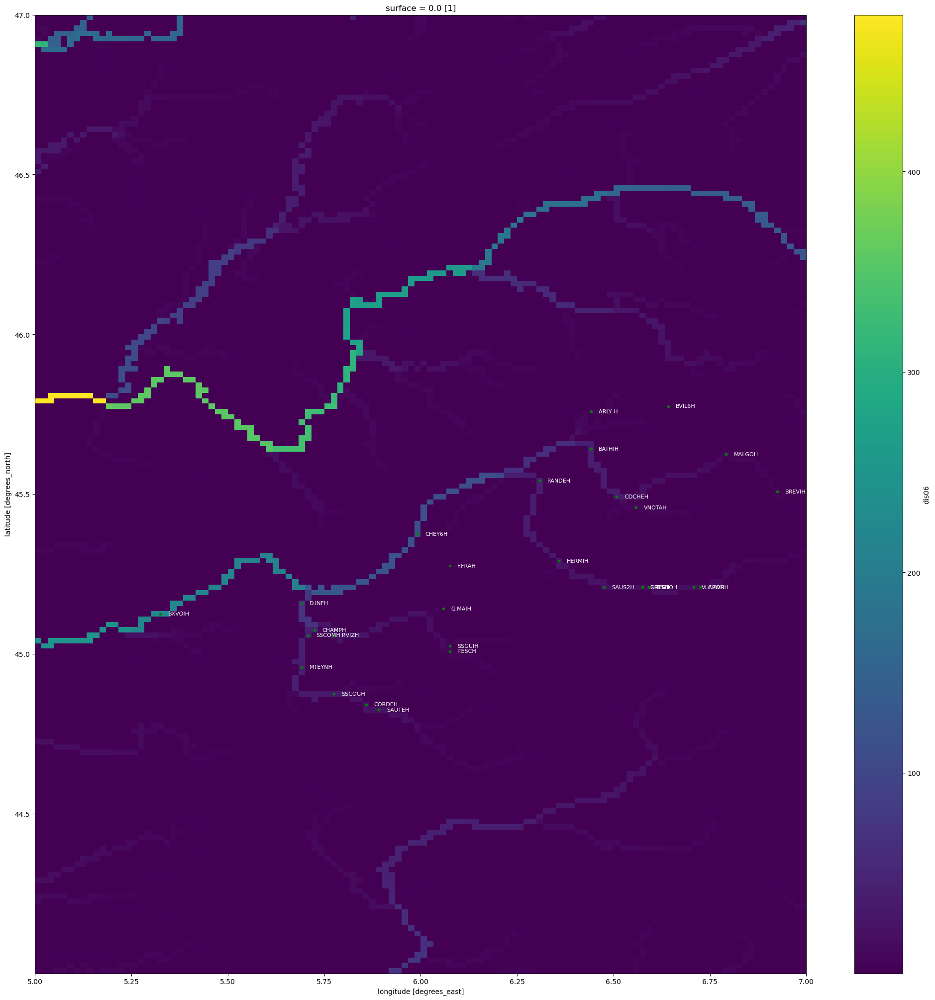

In [27]:
plt.figure(figsize=(25, 25))
dis06_mean.plot()
listAntropizer = []
for c in centralesConsidered :
    centrale = loc_centrale[[c in cent for cent in loc_centrale["Chroniques"].fillna("")]]
    onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), river.debitFile.mean("valid_time").dis06, antiSurf = 10)

    if onRiver != () :
        if (dictCentralesIsere[c]["Q"] > 50) or (dictCentralesIsere[c]["P"] > 30) :
            plt.plot(onRiver[0], onRiver[1], 'g.')
            plt.text(onRiver[0] + 0.02, onRiver[1], c, va='center', fontsize=8, color='white')


        multiplier = dictCentralesIsere[c]["Q"]/dictCentralesIsere[c]["P"]
        df_centrale = prodCentrales[c].resample("D").mean() * multiplier
        df_centrale.index = pd.to_datetime(df_centrale.index)
        timestamp = df_centrale.index.astype(np.int64)//10**9
        f_interp = interp1d(timestamp, df_centrale.values, kind='linear', fill_value='extrapolate')
        timestamp_new = efasTimeseries.valid_time.astype(np.int64)//10**9

        df_corr = f_interp(timestamp_new)
        listAntropizer.append(hydroTwin.anthropizer(river, onRiver[0], onRiver[1], 0, 0, do_command = df_corr, name = c))

In [139]:
onRiver = PointOnRiver((5.224872, 45.076746), river.debitFile.mean("valid_time").dis06, antiSurf = 10)
river.lowest_natural_flow(onRiver, [], listAntropizer)

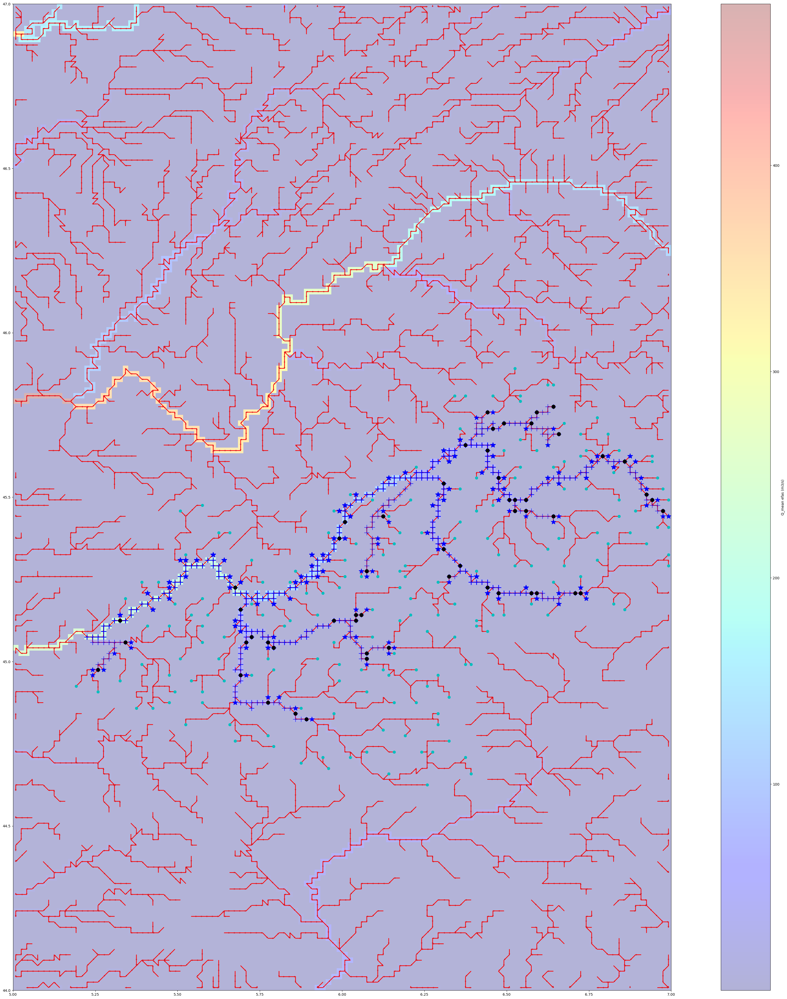

In [144]:
plt.figure(figsize=(50, 50))
river.display_river()   

for d in listAntropizer :
    d.display_anthropizer()

#for s in listStations :
    #s.display_station()

In [141]:
errorSeries = river.simulate([], listAntropizer, onRiver)

In [174]:
errorSeries[1][27]

2001-01-01    1.000977
2001-01-02    1.000977
2001-01-03    1.000977
2001-01-04    1.000610
2001-01-05    1.000488
                ...   
2025-10-28    1.247131
2025-10-29    1.222778
2025-10-30    1.288452
2025-10-31    1.283691
2025-11-01    1.319336
Name: V.ISEH, Length: 9071, dtype: float32

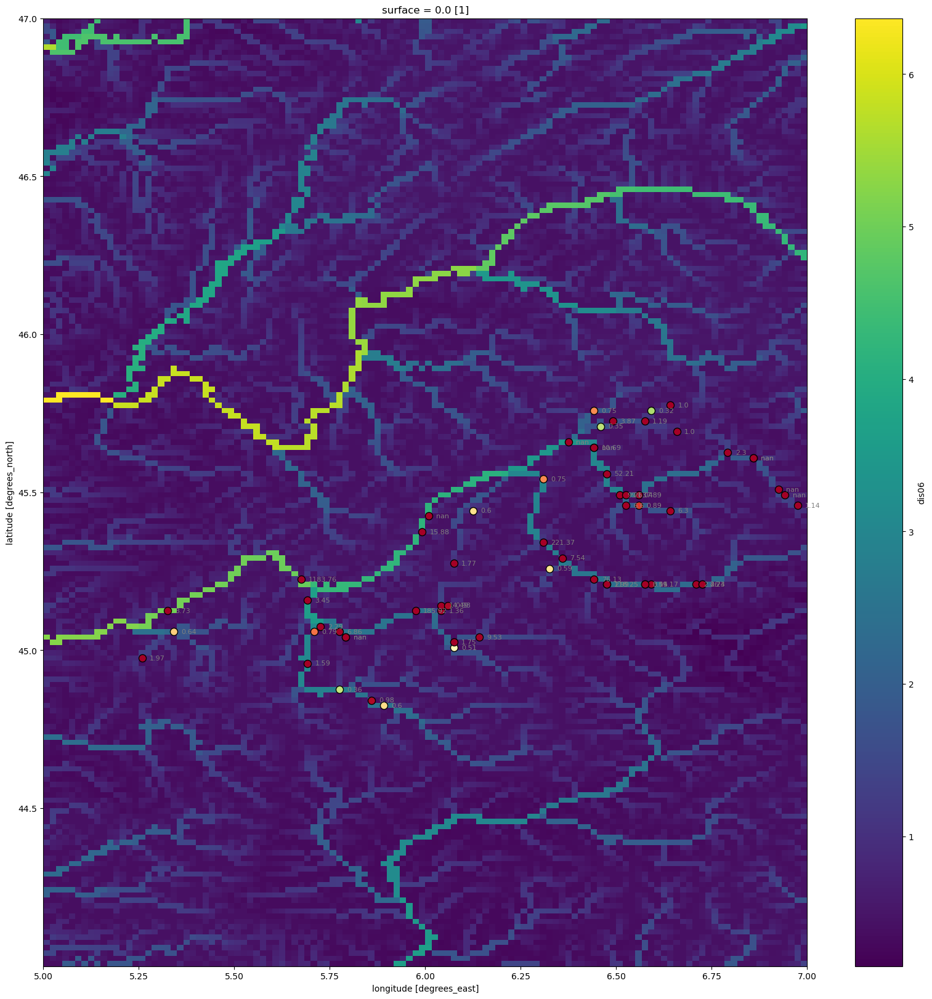

In [175]:
plt.figure(figsize = (20, 20))
(dis06_mean**0.3).plot()

for e in errorSeries[1] :
    multiplier = dictCentralesIsere[e.name]["Q"]/dictCentralesIsere[e.name]["P"]
    df_centrale = prodCentrales[e.name].resample("D").mean() * multiplier
    df_centrale.index = pd.to_datetime(df_centrale.index)
    timestamp = df_centrale.index.astype(np.int64)//10**9
    f_interp = interp1d(timestamp, df_centrale.values, kind='linear', fill_value='extrapolate')
    timestamp_new = efasTimeseries.valid_time.astype(np.int64)//10**9

    df_corr = f_interp(timestamp_new)

    AESerie = (abs(e - df_corr)/np.mean(df_corr))
    centrale = loc_centrale[[e.name in cent for cent in loc_centrale["Chroniques"].fillna("")]]
    onRiver = PointOnRiver((centrale['lon_site'].values[0], centrale['lat_site'].values[0]), river.debitFile.mean("valid_time").dis06, antiSurf = 10)
    plt.scatter(onRiver[0], onRiver[1], c = [min(1, np.mean(AESerie))], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
    plt.text(onRiver[0] + 0.02, onRiver[1], str(round(np.mean(AESerie), ndigits=2)), va='center', fontsize=8, color='grey')


ValueError: operands could not be broadcast together with shapes (12,9071) (39765,) 

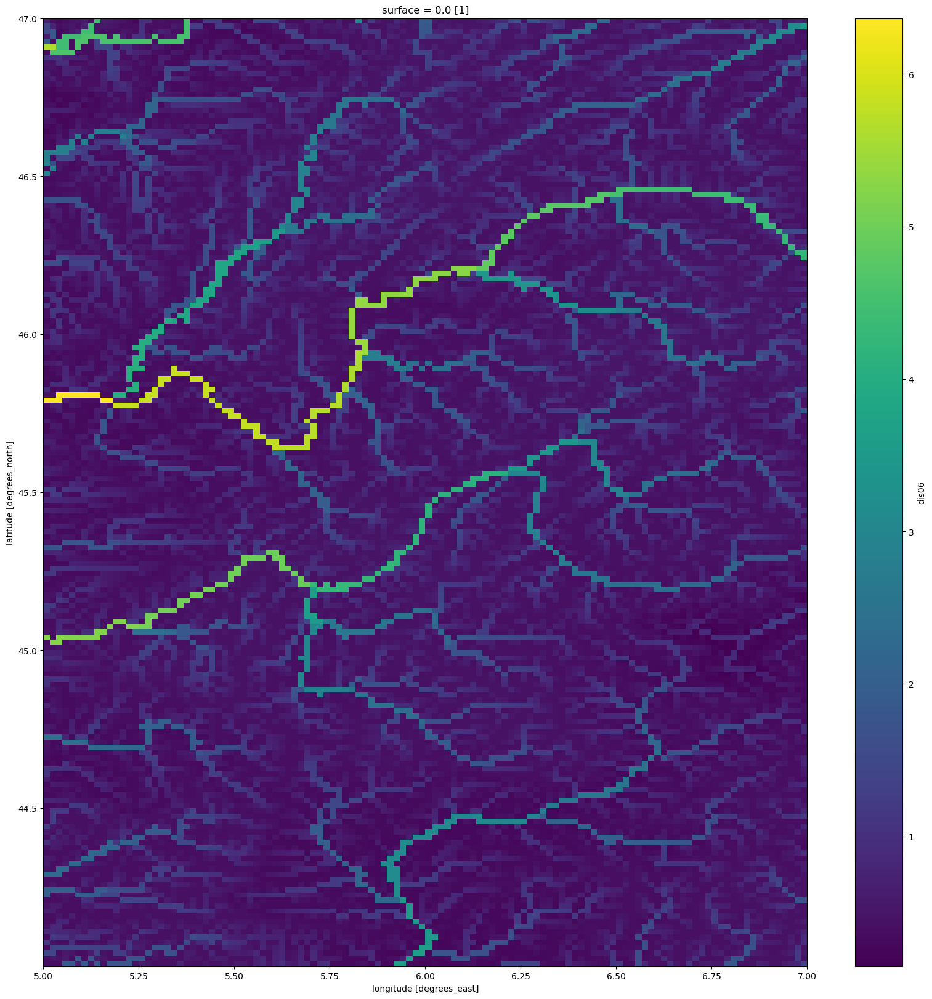

In [97]:
plt.figure(figsize = (20, 20))
(dis06_mean**0.3).plot()

for station, e in zip(['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'], errorSeries) :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        AESerie = (abs(e - df_station)/np.mean(df_station))
        AESerie = AESerie.groupby(AESerie.index.dayofyear).mean()
        plt.scatter(onRiver[0], onRiver[1], c = [min(1, np.mean(AESerie))], marker = '.', cmap='RdYlGn_r', vmin=0, vmax=1.0001, s=300, edgecolors='black')
        plt.text(onRiver[0] + 0.02, onRiver[1], str(round(np.mean(AESerie), ndigits=2)), va='center', fontsize=8, color='white')



(0.0, 5.0)

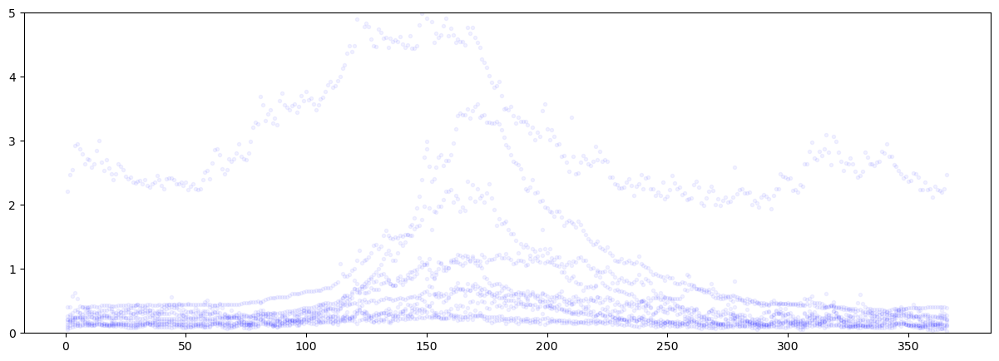

In [ ]:
plt.figure(figsize=(15, 5))

for station, e in zip(['45.06199338984029, 5.2798844843272095',
                '45.12050837500906, 6.019748115998979',
                '45.20081819374862, 5.692225361065678',
                '45.3718585724766, 5.982370397398981',
                '45.20698923511749, 5.465894045273476',
                '45.434988379132335, 6.001907438387778',
                '45.223992937952296, 6.763948182133259',
                '45.44744562807864, 6.987205267318829',
                '45.058988733188436, 5.342885953485408',
                '45.11899592877286, 5.9799136826968',
                '45.527470593729404, 6.321140317012085',
                '45.03860770084426, 6.18296921362009'], errorSeries[0]) :
    (lat, lon) = station.split(", ")
    (lat, lon) = (float(lat), float(lon))
    onRiver = PointOnRiver((lon, lat), dis06_mean, antiSurf = 10)
    if onRiver != () :
        efasVal = efasTimeseries.sel(longitude = onRiver[0], latitude = onRiver[1])
        name = debit_histo[debit_histo["point_geo"] == station]["libelle"].values[0]
        df_station = df[name].copy()
        df_station.index = pd.to_datetime(df_station.index)
        AESerie = (abs(e - df_station)/np.mean(df_station))
        AESerie = AESerie.groupby(AESerie.index.dayofyear).mean()
        plt.plot(AESerie.index, AESerie.values, 'b.', alpha = 0.05)

plt.ylim(0, 5)

In [62]:
importlib.reload(hydroTwin)

<module 'hydroTwin' from 'c:\\Users\\paoliniart\\Documents\\Arthur_thèse hydro\\tests\\hydroTwin.py'>

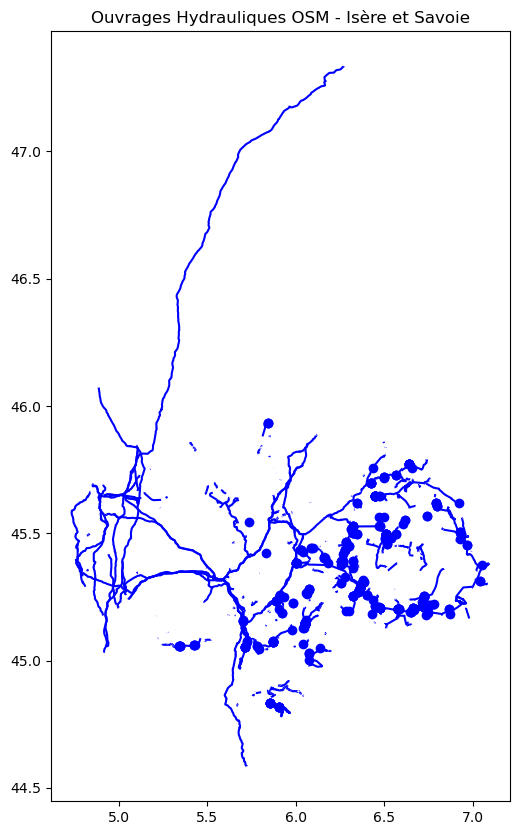

In [8]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Remplace par le chemin de ton fichier ou convertis ton JSON en GeoJSON avant
gdf = gpd.read_file("pipes.geojson")  # ou ton fichier converti

# Affichage simple
gdf.plot(figsize=(10,10), color='blue')
plt.title("Ouvrages Hydrauliques OSM - Isère et Savoie")
plt.show()



In [15]:
import folium
import geopandas as gpd

gdf = gpd.read_file("pipes.geojson")
centroid = gdf.geometry.centroid.iloc[0]
m = folium.Map(location=[centroid.y, centroid.x], zoom_start=10)

folium.GeoJson(gdf).add_to(m)
m.save("carte_osm.html")

C:\Users\paoliniart\AppData\Local\Temp\ipykernel_4784\3418396671.py:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.geometry.centroid.iloc[0]
